To check the ensemble, in this notebook, the visualization of the perturbation and the score of the ensemble will be investigated.

# Load the ensemble and make list 

In [1]:
import xarray as xr

In [2]:
ens_path = "/Odyssey/public/glonet/2022-07-01_init_states"

In [3]:
en1_list = [ens_path + "/ens1_input1.nc", ens_path + "/ens1_input2.nc", ens_path + "/ens1_input3.nc"]
en2_list = [ens_path + "/ens2_input1.nc", ens_path + "/ens2_input2.nc", ens_path + "/ens2_input3.nc"]
en3_list = [ens_path + "/ens3_input1.nc", ens_path + "/ens3_input2.nc", ens_path + "/ens3_input3.nc"]
en4_list = [ens_path + "/ens33_input1.nc", ens_path + "/ens33_input2.nc", ens_path + "/ens33_input3.nc"]
en5_list = [ens_path + "/ens4_input1.nc", ens_path + "/ens4_input2.nc", ens_path + "/ens4_input3.nc"]

ens1 = xr.open_mfdataset(en1_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})  # Adjust chunk sizes as needed
ens2 = xr.open_mfdataset(en2_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})
ens3 = xr.open_mfdataset(en3_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})
ens4 = xr.open_mfdataset(en4_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})
ens5 = xr.open_mfdataset(en5_list, 
                         combine="by_coords", 
                         chunks={"time" : 15, "lat" : 96, "lon" : 96})

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize
import warnings
warnings.filterwarnings('ignore')

In [5]:
# Define ensemble list for easier handling
ensembles = [ens1, ens2, ens3, ens4, ens5]
ensemble_names = ['Ensemble 1', 'Ensemble 2', 'Ensemble 3', 'Ensemble 4', 'Ensemble 5']

# Define regions of interest (dynamical zones)
regions = {
    'Gulf Stream': {'lat_min': 30, 'lat_max': 45, 'lon_min': -80, 'lon_max': -60},
    'Agulhas Current': {'lat_min': -45, 'lat_max': -30, 'lon_min': 15, 'lon_max': 35},
    'Kuroshio Current': {'lat_min': 30, 'lat_max': 45, 'lon_min': 130, 'lon_max': 150},
    'Antarctic Circumpolar': {'lat_min': -65, 'lat_max': -45, 'lon_min': -180, 'lon_max': 180}
}

print("Ensemble datasets loaded and regions defined:")
for i, name in enumerate(ensemble_names):
    print(f"{name}: {ensembles[i].dims}")
print(f"\nDynamical regions: {list(regions.keys())}")

Ensemble datasets loaded and regions defined:
Ensemble 1: FrozenMappingWarningOnValuesAccess({'time': 2, 'ch': 85, 'lat': 672, 'lon': 1440})
Ensemble 2: FrozenMappingWarningOnValuesAccess({'time': 2, 'ch': 85, 'lat': 672, 'lon': 1440})
Ensemble 3: FrozenMappingWarningOnValuesAccess({'time': 2, 'ch': 85, 'lat': 672, 'lon': 1440})
Ensemble 4: FrozenMappingWarningOnValuesAccess({'time': 2, 'ch': 85, 'lat': 672, 'lon': 1440})
Ensemble 5: FrozenMappingWarningOnValuesAccess({'time': 2, 'ch': 85, 'lat': 672, 'lon': 1440})

Dynamical regions: ['Gulf Stream', 'Agulhas Current', 'Kuroshio Current', 'Antarctic Circumpolar']


# Define functions to comparaison

In [6]:
def plot_global_comparison(ensembles, ensemble_names, variable='data', time_idx=0, channel_idx=0):
    """
    Plot global comparison of all ensembles for a given variable
    Maintains dask arrays until plotting
    """
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()
    
    # Calculate global min/max for consistent colorbar across all ensembles
    global_min = float('inf')
    global_max = float('-inf')
    has_valid_data = False
    
    # First pass: get global min/max (using dask compute only once)
    for ens in ensembles:
        if variable in ens.data_vars:
            # Select specific time and channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            # Compute min/max efficiently with dask
            vmin = float(data_slice.min().compute())
            vmax = float(data_slice.max().compute())
            global_min = min(global_min, vmin)
            global_max = max(global_max, vmax)
            has_valid_data = True
    
    # Handle case with no valid data
    if not has_valid_data:
        print(f"Warning: Variable '{variable}' not found in any ensemble")
        global_min, global_max = 0, 1
    
    norm = Normalize(vmin=global_min, vmax=global_max)
    
    # Plot each ensemble
    im = None  # Initialize im variable
    for i, (ens, name) in enumerate(zip(ensembles, ensemble_names)):
        ax = axes[i]
        
        if variable in ens.data_vars:
            # Select and compute the data slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            # Compute the data (dask to numpy)
            data_computed = data_slice.compute()
            
            # Plot with standard matplotlib
            im = ax.pcolormesh(data_computed.lon, data_computed.lat, data_computed.values,
                              norm=norm, cmap='RdYlBu_r', shading='auto')
            ax.set_title(f'{name}\n{variable} - Time: {time_idx}, Channel: {channel_idx}')
            ax.set_xlabel('Longitude')
            ax.set_ylabel('Latitude')
            ax.grid(True, alpha=0.3)
            
            # Set aspect ratio for better map-like appearance
            ax.set_aspect('equal', adjustable='box')
        else:
            ax.text(0.5, 0.5, f'Variable {variable}\nnot found in {name}', 
                   transform=ax.transAxes, ha='center', va='center')
            ax.set_title(f'{name} - No data')
    
    # Remove empty subplot
    if len(ensembles) < len(axes):
        fig.delaxes(axes[-1])
    
    # Add colorbar only if we have valid data
    if im is not None:
        # Create a new axis for the colorbar at the bottom
        cbar_ax = fig.add_axes([0.69, 0.15, 0.29, 0.02])  # [left, bottom, width, height]
        cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
        cbar.set_label(f'{variable} units', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    return fig

In [7]:
def plot_regional_comparison(ensembles, ensemble_names, region_name, regions, 
                           variable='data', time_idx=0, channel_idx=0):
    """
    Plot regional comparison of all ensembles for a specific dynamical zone
    Maintains dask arrays until plotting
    """
    if region_name not in regions:
        print(f"Region '{region_name}' not found in regions dictionary")
        return
    
    region = regions[region_name]
    
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()
    
    # Calculate regional min/max for consistent colorbar
    regional_min = float('inf')
    regional_max = float('-inf')
    has_valid_data = False
    
    # First pass: get regional min/max
    for ens in ensembles:
        if variable in ens.data_vars:
            # Select region and time/channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            # Select regional data using dask-friendly operations
            regional_data = data_slice.sel(
                lat=slice(region['lat_min'], region['lat_max']),
                lon=slice(region['lon_min'], region['lon_max'])
            )
            
            # Compute min/max efficiently
            vmin = float(regional_data.min().compute())
            vmax = float(regional_data.max().compute())
            regional_min = min(regional_min, vmin)
            regional_max = max(regional_max, vmax)
            has_valid_data = True
    
    # Handle case with no valid data
    if not has_valid_data:
        print(f"Warning: Variable '{variable}' not found in any ensemble")
        regional_min, regional_max = 0, 1
    
    norm = Normalize(vmin=regional_min, vmax=regional_max)
    
    # Plot each ensemble
    im = None  # Initialize im variable
    for i, (ens, name) in enumerate(zip(ensembles, ensemble_names)):
        ax = axes[i]
        
        if variable in ens.data_vars:
            # Select and compute the regional data slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            regional_data = data_slice.sel(
                lat=slice(region['lat_min'], region['lat_max']),
                lon=slice(region['lon_min'], region['lon_max'])
            )
            
            # Compute the data (dask to numpy)
            data_computed = regional_data.compute()
            
            # Plot
            im = ax.pcolormesh(data_computed.lon, data_computed.lat, data_computed.values,
                              norm=norm, cmap='RdYlBu_r')
            ax.set_title(f'{name}\n{region_name}')
            ax.set_xlabel('Longitude')
            ax.set_ylabel('Latitude')
            ax.grid(True, alpha=0.3)
        else:
            ax.text(0.5, 0.5, f'Variable {variable}\nnot found in {name}', 
                   transform=ax.transAxes, ha='center', va='center')
            ax.set_title(f'{name} - No data')
    
    # Remove empty subplot
    if len(ensembles) < len(axes):
        fig.delaxes(axes[-1])
    
    # Add colorbar only if we have valid data
    if im is not None:
        # Create a new axis for the colorbar at the bottom
        cbar_ax = fig.add_axes([0.69, 0.1, 0.29, 0.02])  # [left, bottom, width, height]
        cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
        cbar.set_label(f'{variable} units', fontsize=12)
    
    plt.suptitle(f'{region_name} - {variable} Comparison (Time: {time_idx}, Channel: {channel_idx})', 
                 fontsize=16, y=0.95)
    plt.tight_layout()
    plt.show()
    
    return fig

In [8]:
def calculate_ensemble_statistics(ensembles, ensemble_names, variable='data', 
                                time_idx=0, channel_idx=0):
    """
    Calculate ensemble statistics (mean, std, min, max) while maintaining dask efficiency
    """
    print(f"Calculating ensemble statistics for {variable}...")
    
    # Collect data slices from all ensembles
    data_slices = []
    
    for i, ens in enumerate(ensembles):
        if variable in ens.data_vars:
            # Select time and channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            data_slices.append(data_slice)
            print(f"{ensemble_names[i]}: Shape {data_slice.shape}")
        else:
            print(f"{ensemble_names[i]}: Variable {variable} not found")
    
    if not data_slices:
        print("No valid data found for ensemble statistics")
        return None
    
    # Stack ensembles along a new dimension (keeping dask)
    ensemble_data = xr.concat(data_slices, dim='ensemble')
    
    # Calculate statistics (still using dask)
    stats = {
        'mean': ensemble_data.mean(dim='ensemble'),
        'std': ensemble_data.std(dim='ensemble'),
        'min': ensemble_data.min(dim='ensemble'),
        'max': ensemble_data.max(dim='ensemble')
    }
    
    print("Statistics calculated (lazy evaluation with dask)")
    return stats

In [9]:
def plot_ensemble_statistics(stats, variable='thetao'):
    """
    Plot ensemble statistics (mean, std, min, max) computed with dask
    """
    if stats is None:
        print("No statistics to plot")
        return
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    stat_names = ['mean', 'std', 'min', 'max']
    cmaps = ['RdYlBu_r', 'viridis', 'Blues', 'Reds']
    
    for i, (stat_name, cmap) in enumerate(zip(stat_names, cmaps)):
        ax = axes[i]
        
        # Compute the statistics data (dask to numpy)
        stat_data = stats[stat_name].compute()
        
        # Plot
        im = ax.pcolormesh(stat_data.lon, stat_data.lat, stat_data.values,
                          cmap=cmap, shading='auto')
        ax.set_title(f'Ensemble {stat_name.capitalize()} - {variable}')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.grid(True, alpha=0.3)
        ax.set_aspect('equal', adjustable='box')
        
        # Add colorbar for each subplot
        cbar = plt.colorbar(im, ax=ax, orientation='horizontal', 
                           fraction=0.06, pad=0.15, shrink=0.8)
        cbar.set_label(f'{variable} {stat_name}', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    return fig

# Visualize Ensembles

Now let's use the functions to visualize and compare the ensembles at both global and regional scales.

In [10]:
# Check available variables in the first ensemble
print("Available variables in ensemble 1:")
for var in ens1.data_vars:
    print(f"  - {var}: {ens1[var].dims}, shape: {ens1[var].shape}")

# Choose a variable to visualize (change this based on your data)
variable_to_plot = 'data'  # Updated to use the actual variable name
time_index = 1  # First time step
channel_index = 0  # First channel (instead of depth_index)

print(f"\nWill visualize variable: {variable_to_plot} at time index {time_index}, channel index {channel_index}")
print(f"Note: Your data has {ens1[variable_to_plot].shape[1]} channels and {ens1[variable_to_plot].shape[0]} time steps")

Available variables in ensemble 1:
  - data: ('time', 'ch', 'lat', 'lon'), shape: (2, 85, 672, 1440)

Will visualize variable: data at time index 1, channel index 0
Note: Your data has 85 channels and 2 time steps


Creating global comparison plot...


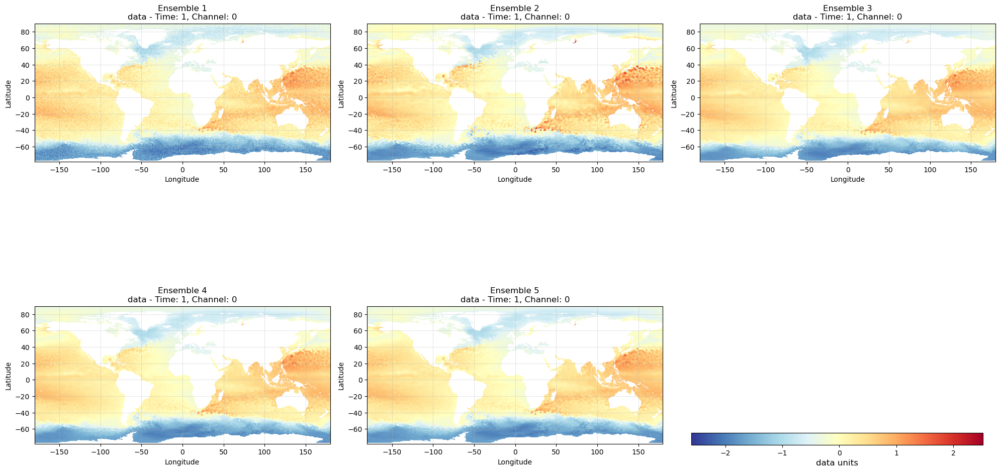

In [11]:
# 1. Global comparison of all ensembles
print("Creating global comparison plot...")
plot1 = plot_global_comparison(ensembles, ensemble_names, 
                      variable=variable_to_plot, 
                      time_idx=time_index, 
                      channel_idx=channel_index)

Creating regional comparison plots...


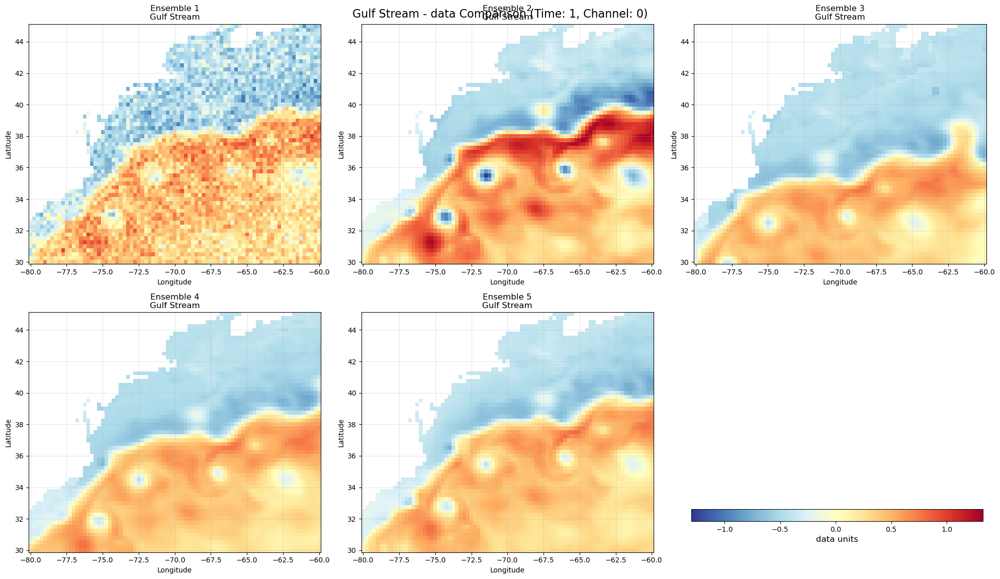

In [12]:
# 2. Regional comparisons for key dynamical zones
print("Creating regional comparison plots...")

# Gulf Stream region
plot2 = plot_regional_comparison(ensembles, ensemble_names, 'Gulf Stream', regions,
                        variable=variable_to_plot, 
                        time_idx=time_index, 
                        channel_idx=channel_index)

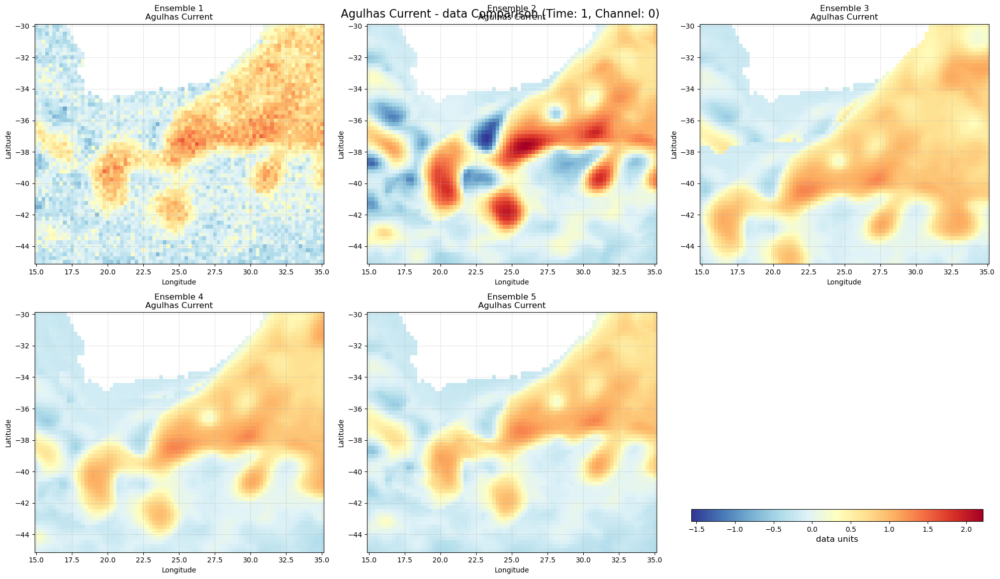

In [13]:
# Agulhas Current region
plot3 = plot_regional_comparison(ensembles, ensemble_names, 'Agulhas Current', regions,
                        variable=variable_to_plot, 
                        time_idx=time_index, 
                        channel_idx=channel_index)

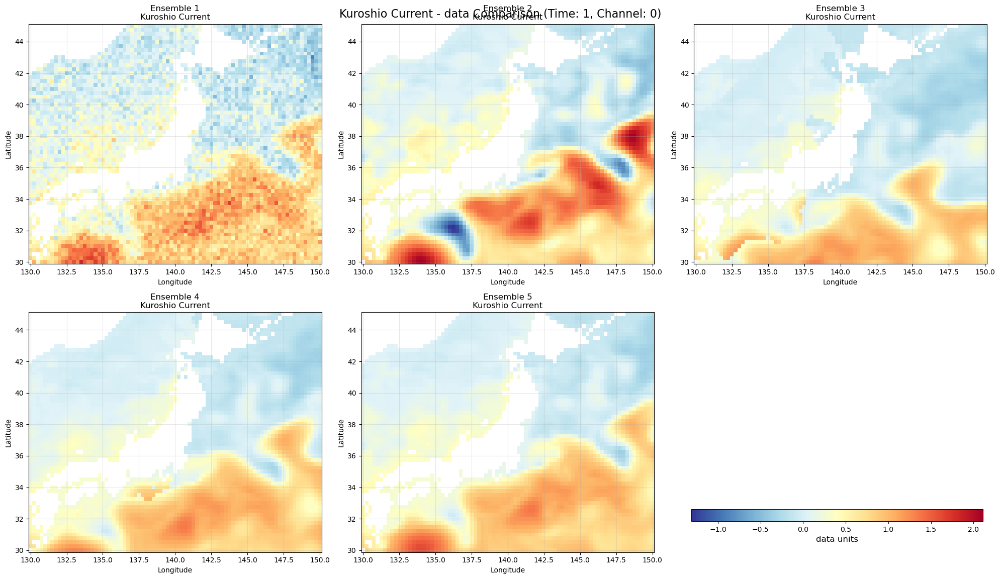

In [14]:
# Kuroshio Current region
plot4 = plot_regional_comparison(ensembles, ensemble_names, 'Kuroshio Current', regions,
                        variable=variable_to_plot, 
                        time_idx=time_index, 
                        channel_idx=channel_index)

Calculating ensemble statistics...
Calculating ensemble statistics for data...
Ensemble 1: Shape (672, 1440)
Ensemble 2: Shape (672, 1440)
Ensemble 3: Shape (672, 1440)
Ensemble 4: Shape (672, 1440)
Ensemble 5: Shape (672, 1440)
Statistics calculated (lazy evaluation with dask)
Plotting ensemble statistics...


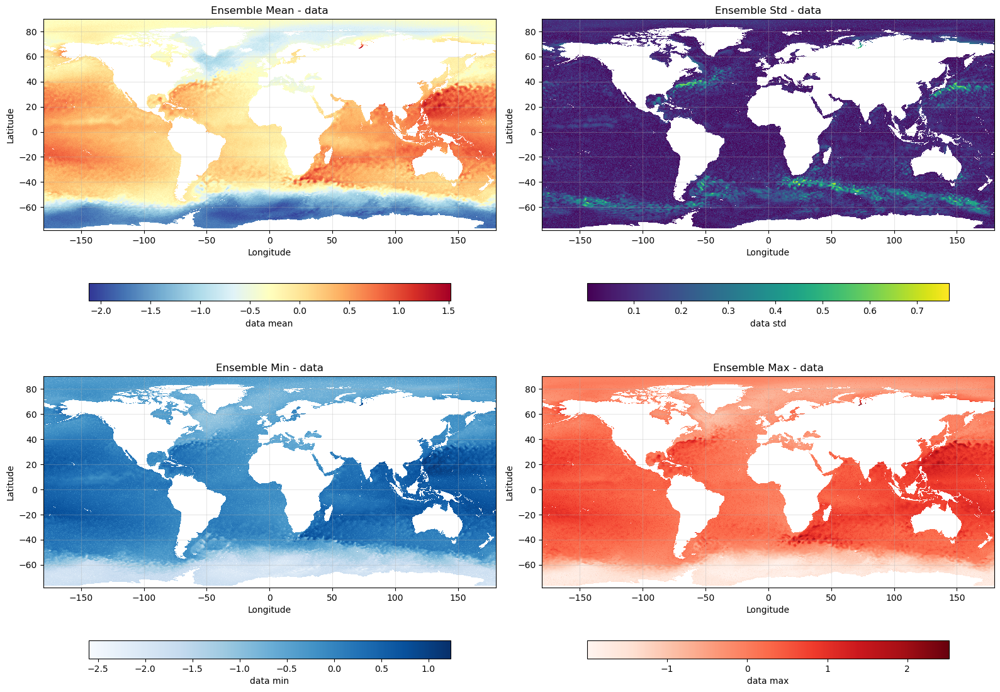

In [15]:
# 3. Calculate and visualize ensemble statistics
print("Calculating ensemble statistics...")
stats = calculate_ensemble_statistics(ensembles, ensemble_names, 
                                     variable=variable_to_plot,
                                     time_idx=time_index, 
                                     channel_idx=channel_index)

if stats:
    print("Plotting ensemble statistics...")
    plot5 = plot_ensemble_statistics(stats, variable=variable_to_plot)

## Advanced Analysis: Ensemble Spread and distribution ##

Rank histogram


In [16]:
in1 = xr.open_dataset(ens_path + "/input1.nc",chunks={"time" : 15, "lat" : 96, "lon" : 96})
in2 = xr.open_dataset(ens_path + "/input2.nc",chunks={"time" : 15, "lat" : 96, "lon" : 96})
in3 = xr.open_dataset(ens_path + "/input3.nc",chunks={"time" : 15, "lat" : 96, "lon" : 96})

In [17]:
reference = xr.concat([in1,in2,in3],dim='ch')
reference = reference.assign_coords(ch=range(len(ens1.ch)))

## Advanced Analysis: Accurancy ##

Let's calculate the distance from the truth/reanalysis data to the ensemble member. </br>
Simply implement Root Mean Square Error (**RMSE**).

In [18]:
def compute_ensemble_rmse(ensembles, reference, variable='data', time_idx=0, channel_idx=0):
    """
    Compute RMSE (Root Mean Square Error) for each ensemble member against reference data
    
    Parameters:
    -----------
    ensembles : list of xarray.Dataset
        List of ensemble datasets
    reference : xarray.Dataset
        Reference dataset (truth/reanalysis)
    variable : str
        Variable name to analyze
    time_idx : int
        Time index to analyze
    channel_idx : int
        Channel/depth index to analyze
    
    Returns:
    --------
    rmse_results : dict
        Dictionary containing:
        - 'individual_rmse': List of RMSE values for each ensemble member
        - 'ensemble_mean_rmse': RMSE of ensemble mean vs reference
        - 'ensemble_names': Names of ensemble members
        - 'reference_data': Reference data slice used
        - 'ensemble_mean': Computed ensemble mean
    """
    print(f"Computing RMSE for {variable} at time {time_idx}, channel {channel_idx}...")
    
    # Extract reference data slice
    if variable in reference.data_vars:
        if 'ch' in reference[variable].dims:
            ref_data = reference[variable].isel(time=time_idx, ch=channel_idx)
        elif 'depth' in reference[variable].dims:
            ref_data = reference[variable].isel(time=time_idx, depth=channel_idx)
        else:
            ref_data = reference[variable].isel(time=time_idx)
        
        # Compute reference data (dask to numpy)
        ref_data_computed = ref_data.compute()
    else:
        raise ValueError(f"Variable {variable} not found in reference dataset")
    
    # Extract ensemble data slices and compute individual RMSEs
    ensemble_data_slices = []
    individual_rmse = []
    
    for i, ens in enumerate(ensembles):
        if variable in ens.data_vars:
            # Select time and channel slice
            if 'ch' in ens[variable].dims:
                ens_data = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                ens_data = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                ens_data = ens[variable].isel(time=time_idx)
            
            # Compute ensemble data (dask to numpy)
            ens_data_computed = ens_data.compute()
            ensemble_data_slices.append(ens_data_computed)
            
            # Compute RMSE for this ensemble member
            # Only compute RMSE where both reference and ensemble have valid data
            valid_mask = ~(np.isnan(ref_data_computed.values) | np.isnan(ens_data_computed.values))
            
            if np.sum(valid_mask) > 0:
                diff_squared = (ref_data_computed.values - ens_data_computed.values) ** 2
                rmse = np.sqrt(np.nanmean(diff_squared[valid_mask]))
                individual_rmse.append(rmse)
                print(f"Ensemble {i+1}: RMSE = {rmse:.6f}")
            else:
                individual_rmse.append(np.nan)
                print(f"Ensemble {i+1}: No valid overlapping data")
        else:
            individual_rmse.append(np.nan)
            print(f"Ensemble {i+1}: Variable {variable} not found")
    
    # Compute ensemble mean
    if ensemble_data_slices:
        # Stack ensemble data along new dimension
        ensemble_stack = xr.concat(ensemble_data_slices, dim='ensemble')
        ensemble_mean = ensemble_stack.mean(dim='ensemble')
        
        # Compute RMSE of ensemble mean vs reference
        valid_mask = ~(np.isnan(ref_data_computed.values) | np.isnan(ensemble_mean.values))
        
        if np.sum(valid_mask) > 0:
            diff_squared = (ref_data_computed.values - ensemble_mean.values) ** 2
            ensemble_mean_rmse = np.sqrt(np.nanmean(diff_squared[valid_mask]))
            print(f"Ensemble Mean: RMSE = {ensemble_mean_rmse:.6f}")
        else:
            ensemble_mean_rmse = np.nan
            print("Ensemble Mean: No valid overlapping data")
    else:
        ensemble_mean = None
        ensemble_mean_rmse = np.nan
    
    # Prepare results
    rmse_results = {
        'individual_rmse': individual_rmse,
        'ensemble_mean_rmse': ensemble_mean_rmse,
        'ensemble_names': ensemble_names if 'ensemble_names' in globals() else [f'Ensemble {i+1}' for i in range(len(ensembles))],
        'reference_data': ref_data_computed,
        'ensemble_mean': ensemble_mean,
        'variable': variable,
        'time_idx': time_idx,
        'channel_idx': channel_idx
    }
    
    return rmse_results


In [19]:
def plot_rmse_analysis(rmse_results, show_spatial_maps=True):
    """
    Plot RMSE analysis results
    
    Parameters:
    -----------
    rmse_results : dict
        Results from compute_ensemble_rmse
    show_spatial_maps : bool
        Whether to show spatial maps of errors
    """
    fig_size = (20, 12) if show_spatial_maps else (12, 8)
    n_plots = 6 if show_spatial_maps else 2
    
    if show_spatial_maps:
        fig, axes = plt.subplots(2, 3, figsize=fig_size)
        axes = axes.flatten()
    else:
        fig, axes = plt.subplots(1, 2, figsize=fig_size)
        if not isinstance(axes, np.ndarray):
            axes = [axes]
    
    # Plot 1: RMSE Bar Chart
    ax_bar = axes[0]
    
    # Prepare data for bar chart
    rmse_values = rmse_results['individual_rmse'] + [rmse_results['ensemble_mean_rmse']]
    labels = rmse_results['ensemble_names'] + ['Ensemble Mean']
    
    # Filter out NaN values
    valid_indices = [i for i, val in enumerate(rmse_values) if not np.isnan(val)]
    valid_rmse = [rmse_values[i] for i in valid_indices]
    valid_labels = [labels[i] for i in valid_indices]
    
    # Color ensemble mean differently
    colors = ['lightblue'] * (len(valid_labels) - 1) + ['red'] if valid_labels else []
    
    if valid_rmse:
        bars = ax_bar.bar(valid_labels, valid_rmse, color=colors, alpha=0.7)
        
        # Add RMSE values on top of bars
        for bar, rmse_val in zip(bars, valid_rmse):
            height = bar.get_height()
            ax_bar.text(bar.get_x() + bar.get_width()/2., height + height*0.01,
                       f'{rmse_val:.4f}', ha='center', va='bottom', fontweight='bold')
        
        ax_bar.set_ylabel('RMSE', fontsize=12)
        ax_bar.set_title(f'Ensemble RMSE vs Reference\n{rmse_results["variable"]} (Time: {rmse_results["time_idx"]}, Ch: {rmse_results["channel_idx"]})', fontsize=14)
        ax_bar.grid(True, alpha=0.3)
        plt.setp(ax_bar.get_xticklabels(), rotation=45, ha='right')
        
        # Statistical summary
        individual_rmse_valid = [val for val in rmse_results['individual_rmse'] if not np.isnan(val)]
        if individual_rmse_valid:
            mean_individual_rmse = np.mean(individual_rmse_valid)
            std_individual_rmse = np.std(individual_rmse_valid)
            
            # Add text box with statistics
            stats_text = f'Individual RMSE:\nMean: {mean_individual_rmse:.4f}\nStd: {std_individual_rmse:.4f}\n'
            if not np.isnan(rmse_results['ensemble_mean_rmse']):
                improvement = ((mean_individual_rmse - rmse_results['ensemble_mean_rmse']) / mean_individual_rmse) * 100
                stats_text += f'Ensemble Mean RMSE: {rmse_results["ensemble_mean_rmse"]:.4f}\nImprovement: {improvement:.1f}%'
            
            ax_bar.text(0.02, 0.98, stats_text, transform=ax_bar.transAxes, 
                       verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    else:
        ax_bar.text(0.5, 0.5, 'No valid RMSE data to plot', transform=ax_bar.transAxes, 
                   ha='center', va='center', fontsize=14)
        ax_bar.set_title('RMSE Analysis - No Valid Data')
    
    if not show_spatial_maps:
        # Just show the comparison plot
        ax_comparison = axes[1] if len(axes) > 1 else fig.add_subplot(1, 2, 2)
        
        # Simple scatter plot of ensemble mean vs reference
        ref_data = rmse_results['reference_data']
        ens_mean = rmse_results['ensemble_mean']
        
        if ref_data is not None and ens_mean is not None:
            ref_flat = ref_data.values.flatten()
            ens_flat = ens_mean.values.flatten()
            
            # Remove NaN values
            valid_mask = ~(np.isnan(ref_flat) | np.isnan(ens_flat))
            ref_valid = ref_flat[valid_mask]
            ens_valid = ens_flat[valid_mask]
            
            if len(ref_valid) > 0:
                ax_comparison.scatter(ref_valid, ens_valid, alpha=0.3, s=1)
                
                # Add 1:1 line
                min_val = min(np.min(ref_valid), np.min(ens_valid))
                max_val = max(np.max(ref_valid), np.max(ens_valid))
                ax_comparison.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8, label='1:1 line')
                
                ax_comparison.set_xlabel('Reference')
                ax_comparison.set_ylabel('Ensemble Mean')
                ax_comparison.set_title('Ensemble Mean vs Reference')
                ax_comparison.grid(True, alpha=0.3)
                ax_comparison.legend()
                
                # Compute correlation
                from scipy.stats import pearsonr
                corr, _ = pearsonr(ref_valid, ens_valid)
                ax_comparison.text(0.05, 0.95, f'Correlation: {corr:.3f}', 
                                 transform=ax_comparison.transAxes, fontsize=12,
                                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    if show_spatial_maps and rmse_results['reference_data'] is not None:
        # Plot spatial maps
        ref_data = rmse_results['reference_data']
        ens_mean = rmse_results['ensemble_mean']
        
        # Plot 2: Reference field
        im2 = axes[1].pcolormesh(ref_data.lon, ref_data.lat, ref_data.values,
                                cmap='RdYlBu_r', shading='auto')
        axes[1].set_title('Reference Field')
        axes[1].set_xlabel('Longitude')
        axes[1].set_ylabel('Latitude')
        axes[1].grid(True, alpha=0.3)
        plt.colorbar(im2, ax=axes[1], orientation='horizontal', fraction=0.08, pad=0.15)
        
        # Plot 3: Ensemble Mean field
        if ens_mean is not None:
            im3 = axes[2].pcolormesh(ens_mean.lon, ens_mean.lat, ens_mean.values,
                                    cmap='RdYlBu_r', shading='auto')
            axes[2].set_title('Ensemble Mean Field')
            axes[2].set_xlabel('Longitude')
            axes[2].set_ylabel('Latitude')
            axes[2].grid(True, alpha=0.3)
            plt.colorbar(im3, ax=axes[2], orientation='horizontal', fraction=0.08, pad=0.15)
            
            # Plot 4: Difference field (Ensemble Mean - Reference)
            diff_field = ens_mean.values - ref_data.values
            im4 = axes[3].pcolormesh(ens_mean.lon, ens_mean.lat, diff_field,
                                    cmap='RdBu_r', shading='auto')
            axes[3].set_title('Difference (Ensemble Mean - Reference)')
            axes[3].set_xlabel('Longitude')
            axes[3].set_ylabel('Latitude')
            axes[3].grid(True, alpha=0.3)
            plt.colorbar(im4, ax=axes[3], orientation='horizontal', fraction=0.08, pad=0.15)
            
            # Plot 5: Squared Error field
            squared_error = (ens_mean.values - ref_data.values) ** 2
            im5 = axes[4].pcolormesh(ens_mean.lon, ens_mean.lat, squared_error,
                                    cmap='Reds', shading='auto')
            axes[4].set_title('Squared Error Field')
            axes[4].set_xlabel('Longitude')
            axes[4].set_ylabel('Latitude')
            axes[4].grid(True, alpha=0.3)
            plt.colorbar(im5, ax=axes[4], orientation='horizontal', fraction=0.08, pad=0.15)
            
            # Plot 6: Scatter plot
            ref_flat = ref_data.values.flatten()
            ens_flat = ens_mean.values.flatten()
            
            # Remove NaN values
            valid_mask = ~(np.isnan(ref_flat) | np.isnan(ens_flat))
            ref_valid = ref_flat[valid_mask]
            ens_valid = ens_flat[valid_mask]
            
            if len(ref_valid) > 0:
                axes[5].scatter(ref_valid, ens_valid, alpha=0.3, s=1)
                
                # Add 1:1 line
                min_val = min(np.min(ref_valid), np.min(ens_valid))
                max_val = max(np.max(ref_valid), np.max(ens_valid))
                axes[5].plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8, label='1:1 line')
                
                axes[5].set_xlabel('Reference')
                axes[5].set_ylabel('Ensemble Mean')
                axes[5].set_title('Ensemble Mean vs Reference')
                axes[5].grid(True, alpha=0.3)
                axes[5].legend()
                
                # Compute correlation
                from scipy.stats import pearsonr
                corr, _ = pearsonr(ref_valid, ens_valid)
                axes[5].text(0.05, 0.95, f'Correlation: {corr:.3f}', 
                           transform=axes[5].transAxes, fontsize=12,
                           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    return fig

ENSEMBLE ACCURACY ANALYSIS (RMSE)
Computing RMSE for data at time 1, channel 0...
Ensemble 1: RMSE = 0.163624
Ensemble 2: RMSE = 0.105499
Ensemble 3: RMSE = 0.197414
Ensemble 4: RMSE = 0.112415
Ensemble 5: RMSE = 0.021186
Ensemble Mean: RMSE = 0.060685

Plotting RMSE analysis...


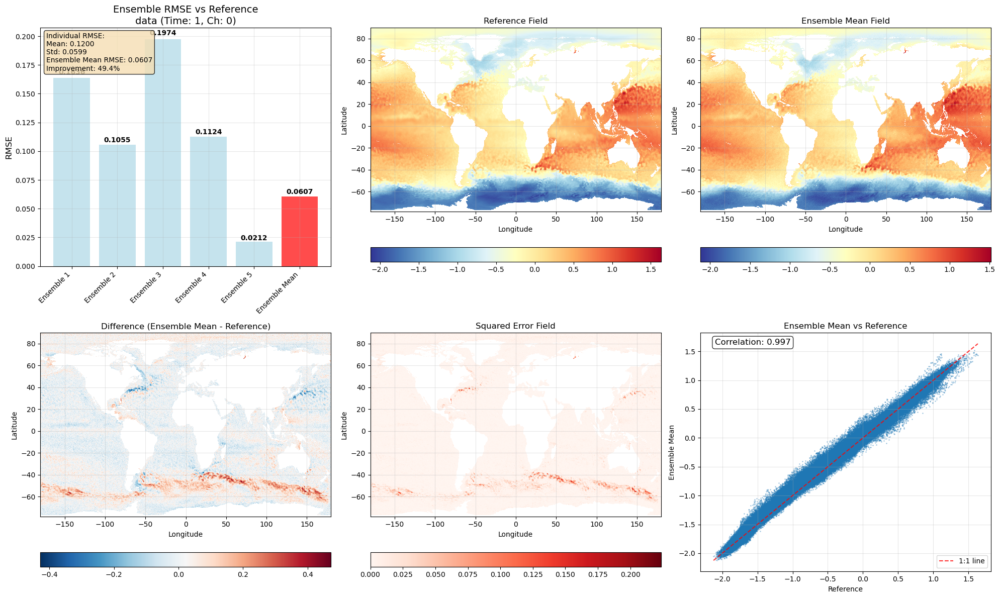

In [20]:
# Compute RMSE accuracy scores
print("=" * 60)
print("ENSEMBLE ACCURACY ANALYSIS (RMSE)")
print("=" * 60)

rmse_results = compute_ensemble_rmse(
    ensembles, reference, 
    variable=variable_to_plot, 
    time_idx=time_index, 
    channel_idx=channel_index
)

# Plot RMSE analysis
print("\nPlotting RMSE analysis...")
rmse_plot = plot_rmse_analysis(rmse_results, show_spatial_maps=True)

## Advanced Analysis: Physical consistancy

Let's analyze the ensemble spread physical consistency with variability.

> In regions where the reanalysis shows high spatial variability, the ensemble should show high spread


In [21]:
# Explicitly override the main function with the perfect version and boundary treatment
def compute_spatial_gradients(data_array, dx=None, dy=None, boundary_treatment='suppress'):
    """
    Compute spatial gradients while preserving EXACT original ocean mask
    Special treatment for land-ocean boundaries to ensure proper ensemble spread comparison
    
    Parameters:
    -----------
    data_array : xarray.DataArray
        2D data field (lat, lon)
    dx, dy : float, optional
        Grid spacing in x and y directions (in degrees or meters)
        If None, will use coordinate differences
    boundary_treatment : str
        How to handle land-ocean boundaries:
        - 'suppress': Set boundary gradients to zero (recommended for ensemble comparison)
        - 'smooth': Use smoothed values at boundaries
        - 'original': Keep original gradient computation (may cause artifacts)
    
    Returns:
    --------
    gradient_magnitude : xarray.DataArray
        Magnitude of spatial gradient (identical mask as original data)
    """
    # If no grid spacing provided, estimate from coordinates
    if dx is None:
        lon_diff = np.diff(data_array.lon.values)
        dx = np.mean(lon_diff) if len(lon_diff) > 0 else 1.0
    
    if dy is None:
        lat_diff = np.diff(data_array.lat.values)
        dy = np.mean(lat_diff) if len(lat_diff) > 0 else 1.0
    
    # Store original ocean mask (True where data is valid/ocean)
    original_ocean_mask = ~np.isnan(data_array.values)
    data_vals = data_array.values.copy()
    
    # Fill NaN values with a smooth field for gradient computation
    # Use mean value to fill all NaN areas
    ocean_mean = np.nanmean(data_vals[original_ocean_mask])
    data_vals_filled = np.where(original_ocean_mask, data_vals, ocean_mean)
    
    # Compute gradients on filled data
    grad_y, grad_x = np.gradient(data_vals_filled, dy, dx)
    
    # Compute gradient magnitude
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
    
    # Handle land-ocean boundaries to ensure proper ensemble spread comparison
    if boundary_treatment == 'suppress':
        # Identify boundary points (ocean points adjacent to land)
        from scipy import ndimage
        
        # Create boundary mask: ocean points that have at least one land neighbor
        structure = np.ones((3, 3))  # 8-connectivity
        ocean_dilated = ndimage.binary_dilation(original_ocean_mask, structure=structure)
        land_dilated = ndimage.binary_dilation(~original_ocean_mask, structure=structure)
        
        # Boundary points: ocean points that are adjacent to land
        boundary_mask = original_ocean_mask & land_dilated
        
        # Suppress gradients at boundary points
        gradient_magnitude = np.where(boundary_mask, 0.0, gradient_magnitude)
        
        print(f"Suppressed gradients at {np.sum(boundary_mask)} land-ocean boundary points")
        
    elif boundary_treatment == 'smooth':
        # Apply additional smoothing near boundaries
        from scipy import ndimage
        
        # Identify boundary region (ocean points within 2 pixels of land)
        structure = np.ones((5, 5))  # Larger neighborhood
        land_dilated = ndimage.binary_dilation(~original_ocean_mask, structure=structure)
        boundary_region = original_ocean_mask & land_dilated
        
        # Apply Gaussian smoothing to gradients in boundary region
        gradient_smoothed = ndimage.gaussian_filter(gradient_magnitude, sigma=1.0)
        gradient_magnitude = np.where(boundary_region, gradient_smoothed, gradient_magnitude)
        
        print(f"Smoothed gradients in boundary region covering {np.sum(boundary_region)} points")
    
    # ABSOLUTELY PRESERVE original mask - set gradients to valid values everywhere ocean exists
    # If gradient computation failed anywhere in ocean, use a fallback value (small gradient)
    fallback_gradient = np.nanmin(gradient_magnitude[original_ocean_mask]) if np.any(original_ocean_mask) else 0.0
    gradient_magnitude = np.where(
        original_ocean_mask,
        np.where(np.isfinite(gradient_magnitude), gradient_magnitude, fallback_gradient),
        np.nan
    )
    
    # Create new DataArray with same coordinates
    grad_da = xr.DataArray(
        gradient_magnitude,
        coords=data_array.coords,
        dims=data_array.dims,
        name=f'{data_array.name}_gradient_magnitude',
        attrs={'boundary_treatment': boundary_treatment}
    )
    
    return grad_da

In [22]:
def compute_ensemble_spread(ensembles, variable='data', time_idx=0, channel_idx=0):
    """
    Compute ensemble spread (standard deviation) at each grid point
    
    Parameters:
    -----------
    ensembles : list of xarray.Dataset
        List of ensemble datasets
    variable : str
        Variable name to analyze
    time_idx : int
        Time index to analyze
    channel_idx : int
        Channel/depth index to analyze
    
    Returns:
    --------
    ensemble_spread : xarray.DataArray
        Standard deviation across ensemble members at each grid point
    ensemble_mean : xarray.DataArray
        Mean across ensemble members at each grid point
    """
    # Collect data slices from all ensembles
    data_slices = []
    
    for ens in ensembles:
        if variable in ens.data_vars:
            # Select time and channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            data_slices.append(data_slice)
    
    if not data_slices:
        raise ValueError(f"No valid data found for variable {variable}")
    
    # Stack ensembles along a new dimension
    ensemble_data = xr.concat(data_slices, dim='ensemble')
    
    # Compute ensemble statistics
    ensemble_mean = ensemble_data.mean(dim='ensemble')
    ensemble_spread = ensemble_data.std(dim='ensemble')
    
    return ensemble_spread, ensemble_mean

In [23]:
def create_ocean_mask(data_array, mask_type='ocean', gradient_threshold=None):
    """
    Create spatial masks for focused analysis
    
    Parameters:
    -----------
    data_array : xarray.DataArray
        2D data field to create mask from
    mask_type : str
        Type of mask: 'ocean', 'coastal', 'high_gradient'
    gradient_threshold : float, optional
        Threshold for high-gradient mask (percentile if < 1, absolute if >= 1)
    
    Returns:
    --------
    mask : xarray.DataArray
        Boolean mask (True where condition is met)
    """
    # Basic ocean mask (non-NaN values)
    ocean_mask = ~np.isnan(data_array.values)
    
    if mask_type == 'ocean':
        mask_values = ocean_mask
        
    elif mask_type == 'coastal':
        # Coastal areas: points near land-ocean boundaries
        from scipy import ndimage
        
        # Create a binary ocean mask
        binary_ocean = ocean_mask.astype(int)
        
        # Find edges using gradient
        edges = ndimage.sobel(binary_ocean)
        coastal_mask = (edges != 0) & ocean_mask
        mask_values = coastal_mask
        
    elif mask_type == 'high_gradient':
        # High gradient areas
        if gradient_threshold is None:
            gradient_threshold = 0.9  # 90th percentile
            
        gradients = compute_spatial_gradients(data_array)
        
        # Only use ocean points for gradient threshold calculation
        grad_values = gradients.values[ocean_mask]
        grad_values_clean = grad_values[~np.isnan(grad_values)]  # Remove any remaining NaNs
        
        if len(grad_values_clean) == 0:
            print("Warning: No valid gradient values found in ocean areas")
            mask_values = np.zeros_like(ocean_mask, dtype=bool)
        else:
            if gradient_threshold < 1:
                # Interpret as percentile
                threshold_val = np.nanpercentile(grad_values_clean, gradient_threshold * 100)
            else:
                # Interpret as absolute threshold
                threshold_val = gradient_threshold
                
            # High gradient mask: only in ocean areas AND above threshold
            high_grad_mask = (gradients.values >= threshold_val) & ocean_mask
            mask_values = high_grad_mask
        
    else:
        raise ValueError(f"Unknown mask_type: {mask_type}")
    
    # Create DataArray with same coordinates
    mask_da = xr.DataArray(
        mask_values,
        coords=data_array.coords,
        dims=data_array.dims,
        name=f'{mask_type}_mask'
    )
    
    return mask_da

In [24]:
def compute_gradient_spread_correlation(ensembles, variable='data', time_idx=0, channel_idx=0, 
                                      mask_type='ocean', gradient_threshold=None):
    """
    Compute Local Gradient-Spread Correlation analysis
    
    This function:
    1. Computes spatial gradient magnitude of the ensemble mean (proxy for reanalysis)
    2. Computes ensemble spread at each grid point
    3. Computes correlation between gradient and spread across the domain
    
    Parameters:
    -----------
    ensembles : list of xarray.Dataset
        List of ensemble datasets
    variable : str
        Variable name to analyze
    time_idx : int
        Time index to analyze
    channel_idx : int
        Channel/depth index to analyze
    mask_type : str
        Type of spatial mask: 'ocean', 'coastal', 'high_gradient'
    gradient_threshold : float, optional
        Threshold for high-gradient mask
    
    Returns:
    --------
    results : dict
        Dictionary containing:
        - 'gradient_magnitude': Spatial gradient magnitude
        - 'ensemble_spread': Ensemble spread
        - 'ensemble_mean': Ensemble mean
        - 'mask': Spatial mask used
        - 'correlation': Correlation coefficient
        - 'correlation_pvalue': P-value of correlation
        - 'masked_correlation': Correlation using only masked points
    """
    from scipy.stats import pearsonr
    
    # Step 1: Compute ensemble spread and mean
    print("Computing ensemble spread and mean...")
    ensemble_spread, ensemble_mean = compute_ensemble_spread(
        ensembles, variable, time_idx, channel_idx
    )
    
    # Compute ensemble mean (compute dask arrays)
    ensemble_mean_computed = ensemble_mean.compute()
    ensemble_spread_computed = ensemble_spread.compute()
    
    # Step 2: Compute spatial gradient magnitude of ensemble mean
    print("Computing spatial gradients with land-ocean boundary treatment...")
    gradient_magnitude = compute_spatial_gradients(ensemble_mean_computed, 
                                                 boundary_treatment='smooth')
    
    # Step 3: Create spatial mask
    print(f"Creating {mask_type} mask...")
    mask = create_ocean_mask(ensemble_mean_computed, mask_type, gradient_threshold)
    
    # Step 4: Compute correlations
    print("Computing correlations...")
    
    # Flatten arrays for correlation computation
    grad_flat = gradient_magnitude.values.flatten()
    spread_flat = ensemble_spread_computed.values.flatten()
    mask_flat = mask.values.flatten()
    
    # Remove NaN values
    valid_indices = ~(np.isnan(grad_flat) | np.isnan(spread_flat))
    grad_valid = grad_flat[valid_indices]
    spread_valid = spread_flat[valid_indices]
    mask_valid = mask_flat[valid_indices]
    
    # Overall correlation
    if len(grad_valid) > 1:
        correlation, p_value = pearsonr(grad_valid, spread_valid)
    else:
        correlation, p_value = np.nan, np.nan
    
    # Masked correlation (only where mask is True)
    masked_indices = mask_valid & valid_indices[valid_indices]
    if np.sum(masked_indices) > 1:
        grad_masked = grad_valid[masked_indices]
        spread_masked = spread_valid[masked_indices]
        masked_correlation, masked_p_value = pearsonr(grad_masked, spread_masked)
    else:
        masked_correlation, masked_p_value = np.nan, np.nan
    
    # Prepare results
    results = {
        'gradient_magnitude': gradient_magnitude,
        'ensemble_spread': ensemble_spread_computed,
        'ensemble_mean': ensemble_mean_computed,
        'mask': mask,
        'correlation': correlation,
        'correlation_pvalue': p_value,
        'masked_correlation': masked_correlation,
        'masked_correlation_pvalue': masked_p_value,
        'n_points_total': len(grad_valid),
        'n_points_masked': np.sum(masked_indices) if 'masked_indices' in locals() else 0
    }
    
    # Print summary
    print(f"\nGradient-Spread Correlation Results:")
    print(f"Overall correlation (r): {correlation:.4f} (p={p_value:.4f})")
    print(f"Masked correlation (r): {masked_correlation:.4f} (p={masked_p_value:.4f})")
    print(f"Total valid points: {results['n_points_total']}")
    print(f"Masked points used: {results['n_points_masked']}")
    
    return results

In [25]:
def plot_gradient_spread_analysis(results, variable='data', region_name=None, global_results=None):
    """
    Plot the gradient-spread correlation analysis results with optional global comparison
    
    Parameters:
    -----------
    results : dict
        Results from compute_gradient_spread_correlation
    variable : str
        Variable name for labeling
    region_name : str, optional
        Region name for title
    global_results : dict, optional
        Global ocean results for comparison in regional plots
    """
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    
    gradient_mag = results['gradient_magnitude']
    ensemble_spread = results['ensemble_spread']
    ensemble_mean = results['ensemble_mean']
    mask = results['mask']
    
    # Plot 1: Ensemble Mean
    im1 = axes[0, 0].pcolormesh(ensemble_mean.lon, ensemble_mean.lat, ensemble_mean.values,
                               cmap='RdYlBu_r', shading='auto')
    axes[0, 0].set_title(f'Ensemble Mean\n{variable}')
    axes[0, 0].set_xlabel('Longitude')
    axes[0, 0].set_ylabel('Latitude')
    axes[0, 0].grid(True, alpha=0.3)
    plt.colorbar(im1, ax=axes[0, 0], orientation='horizontal', fraction=0.08, pad=0.15)
    
    # Plot 2: Gradient Magnitude
    im2 = axes[0, 1].pcolormesh(gradient_mag.lon, gradient_mag.lat, gradient_mag.values,
                               cmap='plasma', shading='auto')
    axes[0, 1].set_title(f'Spatial Gradient Magnitude\n{variable}')
    axes[0, 1].set_xlabel('Longitude')
    axes[0, 1].set_ylabel('Latitude')
    axes[0, 1].grid(True, alpha=0.3)
    plt.colorbar(im2, ax=axes[0, 1], orientation='horizontal', fraction=0.08, pad=0.15)
    
    # Plot 3: Ensemble Spread
    im3 = axes[0, 2].pcolormesh(ensemble_spread.lon, ensemble_spread.lat, ensemble_spread.values,
                               cmap='viridis', shading='auto')
    axes[0, 2].set_title(f'Ensemble Spread (Std Dev)\n{variable}')
    axes[0, 2].set_xlabel('Longitude')
    axes[0, 2].set_ylabel('Latitude')
    axes[0, 2].grid(True, alpha=0.3)
    plt.colorbar(im3, ax=axes[0, 2], orientation='horizontal', fraction=0.08, pad=0.15)
    
    # Plot 4: Spatial Mask
    im4 = axes[1, 0].pcolormesh(mask.lon, mask.lat, mask.values.astype(float),
                               cmap='RdGy', shading='auto', vmin=0, vmax=1)
    axes[1, 0].set_title(f'Spatial Mask\n({mask.name})')
    axes[1, 0].set_xlabel('Longitude')
    axes[1, 0].set_ylabel('Latitude')
    axes[1, 0].grid(True, alpha=0.3)
    plt.colorbar(im4, ax=axes[1, 0], orientation='horizontal', fraction=0.08, pad=0.15)
    
    # Plot 5: Scatter plot - Gradient vs Spread with Global Comparison
    grad_flat = gradient_mag.values.flatten()
    spread_flat = ensemble_spread.values.flatten()
    mask_flat = mask.values.flatten()
    
    # Remove NaN values
    valid = ~(np.isnan(grad_flat) | np.isnan(spread_flat))
    grad_valid = grad_flat[valid]
    spread_valid = spread_flat[valid]
    mask_valid = mask_flat[valid]
    
    # If global results provided, plot global ocean data as background
    if global_results is not None:
        global_grad_flat = global_results['gradient_magnitude'].values.flatten()
        global_spread_flat = global_results['ensemble_spread'].values.flatten()
        global_valid = ~(np.isnan(global_grad_flat) | np.isnan(global_spread_flat))
        global_grad_valid = global_grad_flat[global_valid]
        global_spread_valid = global_spread_flat[global_valid]
        
        # Plot global data as light background
        axes[1, 1].scatter(global_grad_valid, global_spread_valid, alpha=0.2, s=0.5, 
                          c='lightgray', label='Global ocean', rasterized=True)
    
    # Plot regional points in different colors
    if global_results is not None:
        # Plot all regional points
        axes[1, 1].scatter(grad_valid, spread_valid, alpha=0.6, s=2, c='blue', 
                          label=f'Regional ocean')
        
        # Highlight masked points
        if np.sum(mask_valid) > 0:
            axes[1, 1].scatter(grad_valid[mask_valid], spread_valid[mask_valid], 
                              alpha=0.8, s=3, c='red', label=f'Regional {mask.name}')
    else:
        # Original plotting for global analysis
        axes[1, 1].scatter(grad_valid, spread_valid, alpha=0.3, s=1, c='lightgray', label='All ocean')
        
        # Highlight masked points
        if np.sum(mask_valid) > 0:
            axes[1, 1].scatter(grad_valid[mask_valid], spread_valid[mask_valid], 
                              alpha=0.6, s=2, c='red', label=f'Masked region')
    
    axes[1, 1].set_xlabel('Gradient Magnitude')
    axes[1, 1].set_ylabel('Ensemble Spread')
    title_str = f'Gradient vs Spread\nr = {results["correlation"]:.3f}'
    if results["masked_correlation"] is not np.nan:
        title_str += f' (masked: r = {results["masked_correlation"]:.3f})'
    axes[1, 1].set_title(title_str)
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].legend()
    
    # Plot 6: Correlation Comparison with Global Data
    if global_results is not None:
        # Compare regional vs global correlations
        labels = ['Global\nOcean', 'Regional\nOcean']
        values = [
            global_results['correlation'],
            results['masked_correlation']
        ]
        colors = ['lightblue', 'lightcoral']
        
        # Filter out NaN values
        valid_data = [(label, value, color) for label, value, color in zip(labels, values, colors) 
                      if not np.isnan(value)]
        
        if valid_data:
            labels, values, colors = zip(*valid_data)
            bars = axes[1, 2].bar(labels, values, color=colors, alpha=0.7)
            
            # Add correlation values as text
            for i, (bar, value) in enumerate(zip(bars, values)):
                height = bar.get_height()
                axes[1, 2].text(bar.get_x() + bar.get_width()/2., height + 0.02, 
                               f'{value:.3f}', ha='center', va='bottom', fontsize=10)
        
        axes[1, 2].set_ylabel('Correlation Coefficient')
        axes[1, 2].set_title('Regional vs Global Correlations')
        axes[1, 2].grid(True, alpha=0.3)
        axes[1, 2].set_ylim(-1, 1)
        
    else:
        # Original plotting for global analysis
        axes[1, 2].bar(['Overall\nCorrelation', 'Masked\nCorrelation'], 
                      [results['correlation'], results['masked_correlation']],
                      color=['skyblue', 'salmon'])
        axes[1, 2].set_ylabel('Correlation Coefficient')
        axes[1, 2].set_title('Gradient-Spread Correlations')
        axes[1, 2].grid(True, alpha=0.3)
        axes[1, 2].set_ylim(-1, 1)
        
        # Add correlation values as text
        axes[1, 2].text(0, results['correlation'] + 0.05, f'{results["correlation"]:.3f}', 
                       ha='center', va='bottom')
        if not np.isnan(results['masked_correlation']):
            axes[1, 2].text(1, results['masked_correlation'] + 0.05, 
                           f'{results["masked_correlation"]:.3f}', ha='center', va='bottom')
    
    # Overall title
    title = f'Local Gradient-Spread Correlation Analysis - {variable}'
    if region_name:
        title += f' ({region_name})'
    fig.suptitle(title, fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.show()
    
    return fig

## Local Gradient-Spread Correlation Analysis

Now let's perform the gradient-spread correlation analysis to examine whether ensemble spread is higher in regions with larger spatial gradients (which would indicate physical consistency).

**Theory**: In dynamically active regions with sharp gradients (e.g., fronts, eddies), we expect:
- Higher spatial gradients in the reanalysis field
- Higher ensemble spread due to increased uncertainty
- Positive correlation between gradient magnitude and ensemble spread

### Why Ocean Mask Preservation is Critical

**The Problem**: When computing spatial gradients using `np.gradient()`, the algorithm can generate non-NaN values at land-ocean boundaries even when the original land pixels were NaN. This happens because:

1. `np.gradient()` computes finite differences across the entire grid
2. At land-ocean boundaries, it finds differences between NaN (land) and valid values (ocean)
3. These differences can result in finite gradient values in what should remain land areas

**The Solution**: Our improved `compute_spatial_gradients()` function:

1. Stores the original ocean mask before gradient computation
2. Computes gradients normally 
3. **Critically**: Applies the original ocean mask to the gradient results
4. Ensures gradient values only exist where original data was ocean

**Why This Matters**:
- Prevents artificial "expansion" of ocean areas in gradient fields
- Maintains proper land-ocean boundaries for all subsequent analyses
- Ensures physical consistency in gradient-based metrics
- Prevents contamination of correlation analyses with spurious land-boundary effects

OCEAN-WIDE GRADIENT-SPREAD CORRELATION ANALYSIS
Computing ensemble spread and mean...
Computing spatial gradients with land-ocean boundary treatment...
Smoothed gradients in boundary region covering 50527 points
Creating ocean mask...
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.1501 (p=0.0000)
Masked correlation (r): 0.1501 (p=0.0000)
Total valid points: 675219
Masked points used: 675219


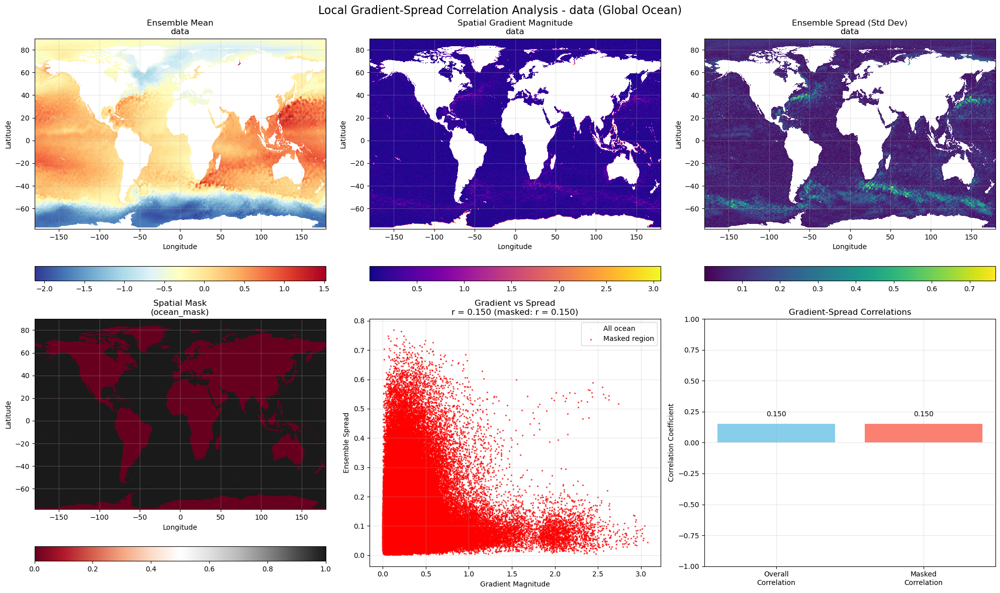

In [26]:
# Perform gradient-spread correlation analysis with different masks

# 1. Ocean-wide analysis
print("=" * 60)
print("OCEAN-WIDE GRADIENT-SPREAD CORRELATION ANALYSIS")
print("=" * 60)

results_ocean = compute_gradient_spread_correlation(
    ensembles, 
    variable=variable_to_plot, 
    time_idx=time_index, 
    channel_idx=channel_index,
    mask_type='ocean'
)

# Plot results
plot6 = plot_gradient_spread_analysis(results_ocean, variable=variable_to_plot, region_name='Global Ocean')

# Store global ocean results for regional comparisons
global_ocean_results = results_ocean


HIGH-GRADIENT REGION ANALYSIS
Computing ensemble spread and mean...
Computing spatial gradients with land-ocean boundary treatment...
Smoothed gradients in boundary region covering 50527 points
Creating high_gradient mask...
Suppressed gradients at 27551 land-ocean boundary points
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.1501 (p=0.0000)
Masked correlation (r): 0.3302 (p=0.0000)
Total valid points: 675219
Masked points used: 135044


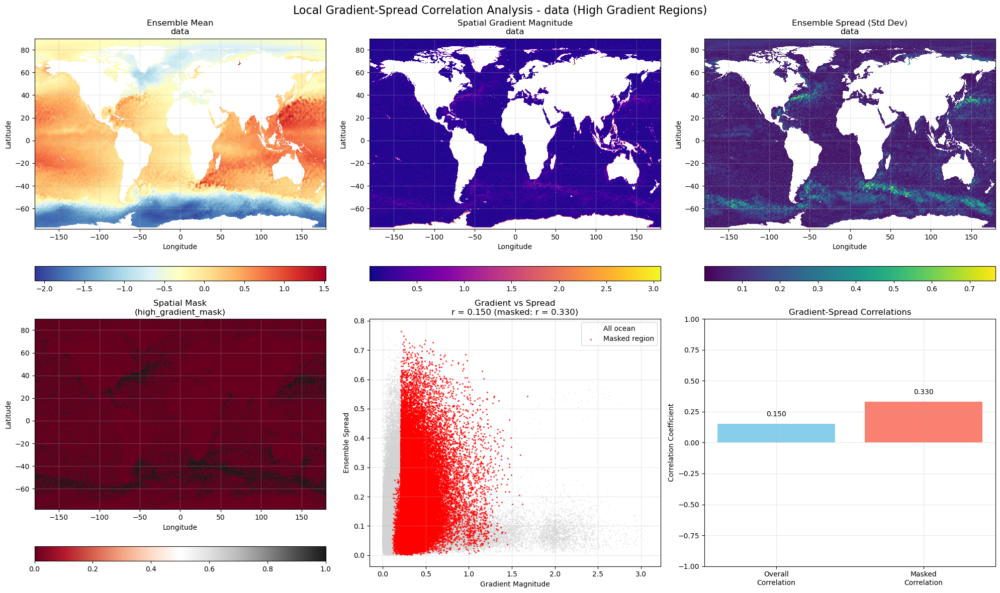

In [27]:
# 2. High-gradient region analysis
print("\n" + "=" * 60)
print("HIGH-GRADIENT REGION ANALYSIS")
print("=" * 60)

results_high_grad = compute_gradient_spread_correlation(
    ensembles, 
    variable=variable_to_plot, 
    time_idx=time_index, 
    channel_idx=channel_index,
    mask_type='high_gradient',
    gradient_threshold=0.8  # Top 20% of gradient values
)

# Plot results
plot7 = plot_gradient_spread_analysis(results_high_grad, variable=variable_to_plot, region_name='High Gradient Regions')

# Store global high gradient results for regional comparisons
global_high_grad_results = results_high_grad


COASTAL ZONE ANALYSIS
Computing ensemble spread and mean...
Computing spatial gradients with land-ocean boundary treatment...
Smoothed gradients in boundary region covering 50527 points
Creating coastal mask...
Computing correlations...

Gradient-Spread Correlation Results:
Overall correlation (r): 0.1501 (p=0.0000)
Masked correlation (r): 0.0343 (p=0.0000)
Total valid points: 675219
Masked points used: 20935


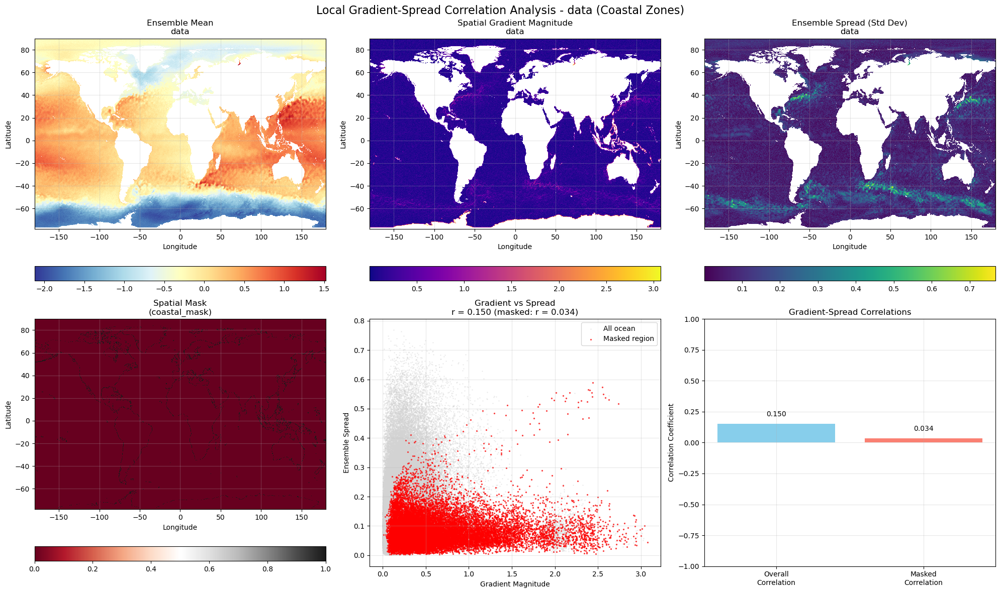

In [28]:
# 3. Coastal zone analysis
print("\n" + "=" * 60)
print("COASTAL ZONE ANALYSIS")
print("=" * 60)

try:
    results_coastal = compute_gradient_spread_correlation(
        ensembles, 
        variable=variable_to_plot, 
        
        time_idx=time_index, 
        channel_idx=channel_index,
        mask_type='coastal'
    )
    
    # Plot results
    plot8 = plot_gradient_spread_analysis(results_coastal, variable=variable_to_plot, region_name='Coastal Zones')
    
    # Store global coastal results for regional comparisons
    global_coastal_results = results_coastal
    
except Exception as e:
    print(f"Coastal analysis failed: {e}")
    print("This might be due to the data structure - skipping coastal analysis")


REGIONAL DYNAMICAL ZONE ANALYSIS

ANALYZING GULF STREAM REGION

--- OCEAN MASK ANALYSIS ---
Extracting regional data for Gulf Stream...
Computing regional ensemble spread and mean...
Computing regional spatial gradients with boundary treatment...
Creating regional ocean mask using global scheme...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Gulf Stream:
Mask type: ocean
Overall correlation (r): 0.2498 (p=0.0000)
Masked correlation (r): 0.2498 (p=0.0000)
Total valid points: 3671
Masked points used: 3671


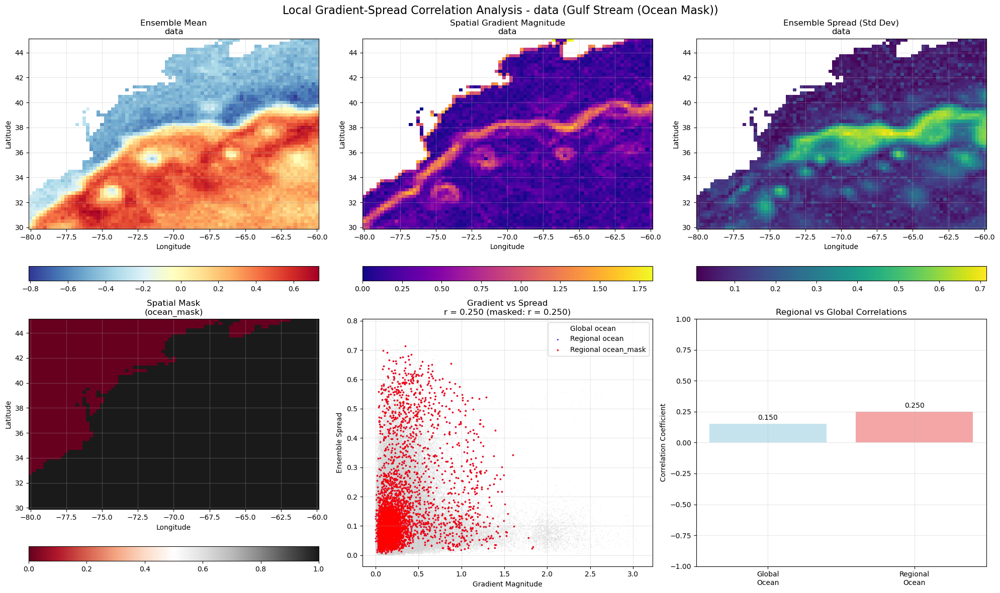


ANALYZING AGULHAS CURRENT REGION

--- OCEAN MASK ANALYSIS ---
Extracting regional data for Agulhas Current...
Computing regional ensemble spread and mean...
Computing regional spatial gradients with boundary treatment...
Creating regional ocean mask using global scheme...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Agulhas Current:
Mask type: ocean
Overall correlation (r): 0.1005 (p=0.0000)
Masked correlation (r): 0.1005 (p=0.0000)
Total valid points: 4182
Masked points used: 4182


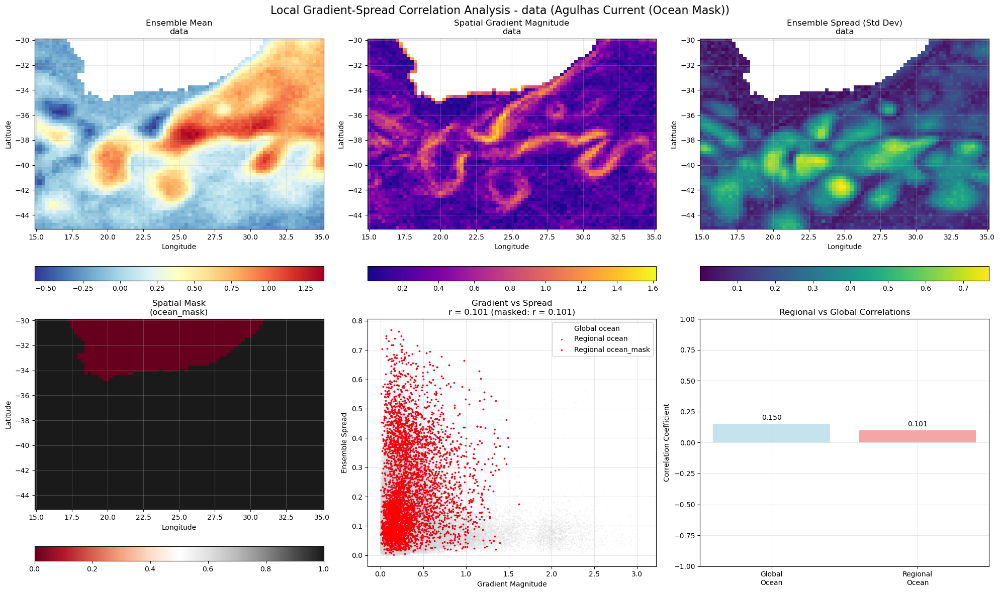


ANALYZING KUROSHIO CURRENT REGION

--- OCEAN MASK ANALYSIS ---
Extracting regional data for Kuroshio Current...
Computing regional ensemble spread and mean...
Computing regional spatial gradients with boundary treatment...
Creating regional ocean mask using global scheme...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Kuroshio Current:
Mask type: ocean
Overall correlation (r): 0.2920 (p=0.0000)
Masked correlation (r): 0.2920 (p=0.0000)
Total valid points: 4056
Masked points used: 4056


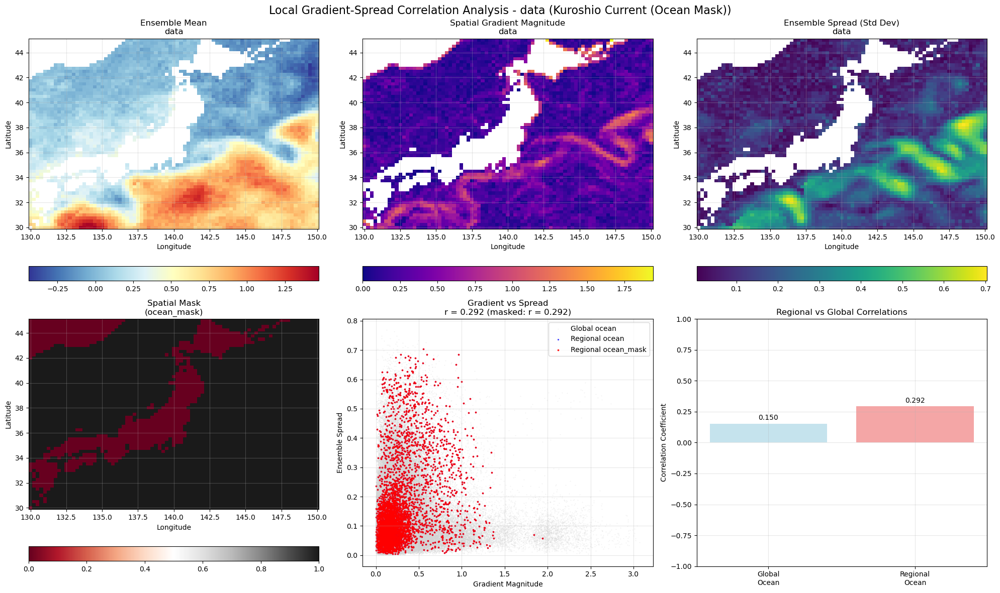


ANALYZING ANTARCTIC CIRCUMPOLAR REGION

--- OCEAN MASK ANALYSIS ---
Extracting regional data for Antarctic Circumpolar...
Computing regional ensemble spread and mean...
Computing regional spatial gradients with boundary treatment...
Creating regional ocean mask using global scheme...
Computing regional correlations...

Regional Gradient-Spread Correlation Results for Antarctic Circumpolar:
Mask type: ocean
Overall correlation (r): 0.1957 (p=0.0000)
Masked correlation (r): 0.1957 (p=0.0000)
Total valid points: 115122
Masked points used: 115122


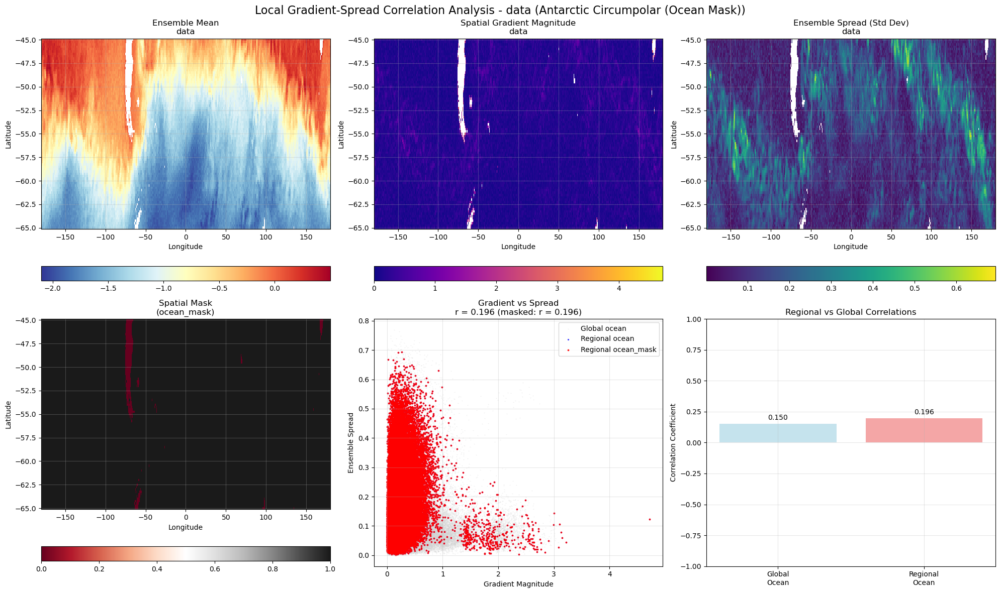


REGIONAL ANALYSIS COMPLETED
Analyzed 4 regions with 1 mask types each
Results stored in regional_results[region_name][mask_type]


In [29]:
# 4. Regional analysis for specific dynamical zones
print("\n" + "=" * 60)
print("REGIONAL DYNAMICAL ZONE ANALYSIS")
print("=" * 60)

# Enhanced function to analyze specific geographical regions with global mask scheme
def regional_gradient_spread_analysis(ensembles, region_name, region_bounds, 
                                    variable='data', time_idx=0, channel_idx=0,
                                    mask_type='ocean', gradient_threshold=None):
    """
    Perform gradient-spread analysis for a specific geographical region
    Now uses the same mask scheme as global analysis for better comparison
    
    Parameters:
    -----------
    ensembles : list of xarray.Dataset
        List of ensemble datasets
    region_name : str
        Name of the region being analyzed
    region_bounds : dict
        Dictionary with 'lat_min', 'lat_max', 'lon_min', 'lon_max'
    variable : str
        Variable name to analyze
    time_idx : int
        Time index to analyze
    channel_idx : int
        Channel/depth index to analyze
    mask_type : str
        Type of spatial mask: 'ocean', 'coastal', 'high_gradient'
    gradient_threshold : float, optional
        Threshold for high-gradient mask (percentile if < 1, absolute if >= 1)
    
    Returns:
    --------
    results : dict
        Dictionary containing analysis results with same structure as global analysis
    """
    from scipy.stats import pearsonr
    
    # Step 1: Get regional data for all ensembles
    print(f"Extracting regional data for {region_name}...")
    regional_ensembles = []
    
    for ens in ensembles:
        if variable in ens.data_vars:
            # Select time and channel slice
            if 'ch' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, ch=channel_idx)
            elif 'depth' in ens[variable].dims:
                data_slice = ens[variable].isel(time=time_idx, depth=channel_idx)
            else:
                data_slice = ens[variable].isel(time=time_idx)
            
            # Select regional data
            regional_data = data_slice.sel(
                lat=slice(region_bounds['lat_min'], region_bounds['lat_max']),
                lon=slice(region_bounds['lon_min'], region_bounds['lon_max'])
            )
            
            # Create a temporary dataset for this region
            regional_ds = xr.Dataset({variable: regional_data})
            regional_ensembles.append(regional_ds)
    
    # Step 2: Compute ensemble spread and mean for regional data
    print("Computing regional ensemble spread and mean...")
    data_slices = []
    
    for regional_ds in regional_ensembles:
        if variable in regional_ds.data_vars:
            data_slices.append(regional_ds[variable])
    
    if not data_slices:
        raise ValueError(f"No valid regional data found for variable {variable}")
    
    # Stack ensembles along a new dimension
    ensemble_data = xr.concat(data_slices, dim='ensemble')
    
    # Compute ensemble statistics
    ensemble_mean = ensemble_data.mean(dim='ensemble')
    ensemble_spread = ensemble_data.std(dim='ensemble')
    
    # Compute ensemble mean (compute dask arrays)
    ensemble_mean_computed = ensemble_mean.compute()
    ensemble_spread_computed = ensemble_spread.compute()
    
    # Step 3: Compute spatial gradient magnitude with boundary treatment
    print("Computing regional spatial gradients with boundary treatment...")
    gradient_magnitude = compute_spatial_gradients(ensemble_mean_computed,
                                                 boundary_treatment='smoooth')
    
    # Step 4: Create spatial mask using GLOBAL SCHEME for better comparison
    print(f"Creating regional {mask_type} mask using global scheme...")
    mask = create_ocean_mask(ensemble_mean_computed, mask_type, gradient_threshold)
    
    # Step 5: Compute correlations (same logic as global analysis)
    print("Computing regional correlations...")
    
    # Flatten arrays for correlation computation
    grad_flat = gradient_magnitude.values.flatten()
    spread_flat = ensemble_spread_computed.values.flatten()
    mask_flat = mask.values.flatten()
    
    # Remove NaN values
    valid_indices = ~(np.isnan(grad_flat) | np.isnan(spread_flat))
    grad_valid = grad_flat[valid_indices]
    spread_valid = spread_flat[valid_indices]
    mask_valid = mask_flat[valid_indices]
    
    # Overall correlation (all valid points in region)
    if len(grad_valid) > 1:
        correlation, p_value = pearsonr(grad_valid, spread_valid)
    else:
        correlation, p_value = np.nan, np.nan
    
    # Masked correlation (only where mask is True)
    masked_indices = mask_valid & valid_indices[valid_indices]
    if np.sum(masked_indices) > 1:
        grad_masked = grad_valid[masked_indices]
        spread_masked = spread_valid[masked_indices]
        masked_correlation, masked_p_value = pearsonr(grad_masked, spread_masked)
    else:
        masked_correlation, masked_p_value = np.nan, np.nan
    
    # Step 6: Prepare results with same structure as global analysis
    results = {
        'gradient_magnitude': gradient_magnitude,
        'ensemble_spread': ensemble_spread_computed,
        'ensemble_mean': ensemble_mean_computed,
        'mask': mask,
        'correlation': correlation,
        'correlation_pvalue': p_value,
        'masked_correlation': masked_correlation,
        'masked_correlation_pvalue': masked_p_value,
        'n_points_total': len(grad_valid),
        'n_points_masked': np.sum(masked_indices) if 'masked_indices' in locals() else 0,
        'region_name': region_name,
        'mask_type': mask_type
    }
    
    # Print summary
    print(f"\nRegional Gradient-Spread Correlation Results for {region_name}:")
    print(f"Mask type: {mask_type}")
    if gradient_threshold is not None:
        print(f"Gradient threshold: {gradient_threshold}")
    print(f"Overall correlation (r): {correlation:.4f} (p={p_value:.4f})")
    print(f"Masked correlation (r): {masked_correlation:.4f} (p={masked_p_value:.4f})")
    print(f"Total valid points: {results['n_points_total']}")
    print(f"Masked points used: {results['n_points_masked']}")
    
    # Print mask statistics
    if mask_type == 'high_gradient' and gradient_threshold is not None:
        n_high_grad = np.sum(mask.values)
        total_ocean = np.sum(~np.isnan(ensemble_mean_computed.values))
        print(f"High gradient points: {n_high_grad} ({n_high_grad/total_ocean*100:.1f}% of ocean)")
    elif mask_type == 'coastal':
        n_coastal = np.sum(mask.values)
        total_ocean = np.sum(~np.isnan(ensemble_mean_computed.values))
        print(f"Coastal points: {n_coastal} ({n_coastal/total_ocean*100:.1f}% of ocean)")
    
    return results

# Analyze all defined regions with multiple mask types for comprehensive comparison
regional_results = {}

# Define mask types to analyze for each region
mask_types_to_analyze = [
    ('ocean', None),

]

for region_name, region_bounds in regions.items():
    print(f"\n{'='*80}")
    print(f"ANALYZING {region_name.upper()} REGION")
    print(f"{'='*80}")
    
    regional_results[region_name] = {}
    
    # Analyze with different mask types
    for mask_type, gradient_threshold in mask_types_to_analyze:
        print(f"\n--- {mask_type.upper()} MASK ANALYSIS ---")
        
        try:
            results = regional_gradient_spread_analysis(
                ensembles, region_name, region_bounds,
                variable_to_plot, time_index, channel_index,
                mask_type=mask_type, gradient_threshold=gradient_threshold
            )
            
            # Store results with mask type identifier
            regional_results[region_name][mask_type] = results
            
            # Plot results for this region and mask type with global comparison
            plot_title = f"{region_name} ({mask_type.replace('_', ' ').title()} Mask)"
            
            # Get corresponding global results for comparison
            global_comparison = None
            if mask_type == 'ocean' and 'global_ocean_results' in locals():
                global_comparison = global_ocean_results
            elif mask_type == 'high_gradient' and 'global_high_grad_results' in locals():
                global_comparison = global_high_grad_results
            elif mask_type == 'coastal' and 'global_coastal_results' in locals():
                global_comparison = global_coastal_results
            
            plot_gradient_spread_analysis(results, variable=variable_to_plot, 
                                        region_name=plot_title, 
                                        global_results=global_comparison)
            
        except Exception as e:
            print(f"{region_name} analysis with {mask_type} mask failed: {e}")
            # Continue with next mask type

print(f"\n{'='*80}")
print("REGIONAL ANALYSIS COMPLETED")
print(f"{'='*80}")
print(f"Analyzed {len(regions)} regions with {len(mask_types_to_analyze)} mask types each")
print("Results stored in regional_results[region_name][mask_type]")

# Summary Analysis and Key Results

This section provides a comprehensive summary of the ensemble analysis and gradient-spread correlation results.

SIMPLE CORRELATION SUMMARY


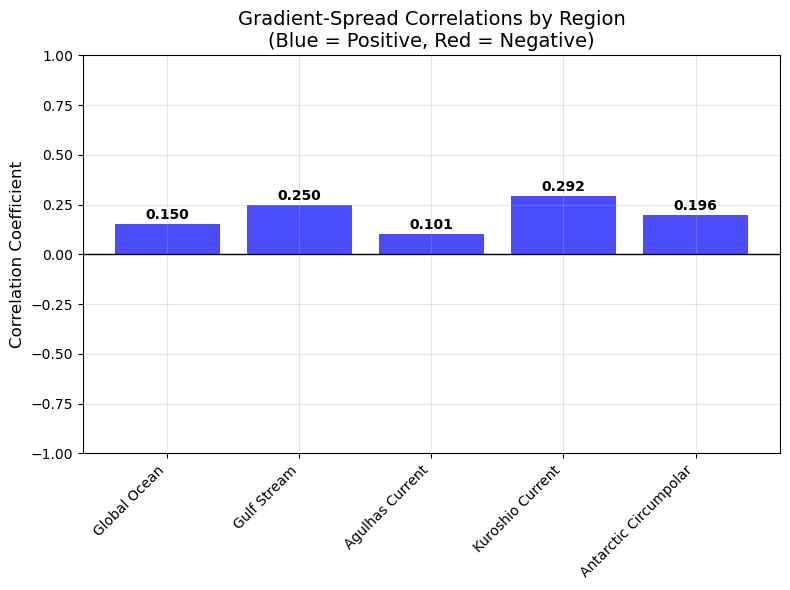


SUMMARY:
Total regions analyzed: 5
Positive correlations: 5/5 (100%)
✓ GOOD: Most regions show positive correlations (physically consistent)


In [30]:
# Simple Correlation Summary Plot
print("="*50)
print("SIMPLE CORRELATION SUMMARY")
print("="*50)

# Collect all correlation results
regions_list = []
correlations_list = []

# Add global result if available
if 'global_ocean_results' in locals():
    regions_list.append('Global Ocean')
    correlations_list.append(global_ocean_results['correlation'])

# Add regional results
if 'regional_results' in locals():
    for region_name, region_data in regional_results.items():
        for mask_type, results in region_data.items():
            regions_list.append(f"{region_name}")
            correlations_list.append(results['correlation'])

# Create simple bar plot
if regions_list and correlations_list:
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    
    # Color bars: blue for positive, red for negative correlations
    colors = ['blue' if r >= 0 else 'red' for r in correlations_list]
    
    bars = ax.bar(regions_list, correlations_list, color=colors, alpha=0.7)
    
    # Add horizontal line at zero
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1)
    
    # Add correlation values on top of bars
    for bar, corr in zip(bars, correlations_list):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + (0.01 if height >= 0 else -0.03),
                f'{corr:.3f}', ha='center', va='bottom' if height >= 0 else 'top', fontweight='bold')
    
    ax.set_ylabel('Correlation Coefficient', fontsize=12)
    ax.set_title('Gradient-Spread Correlations by Region\n(Blue = Positive, Red = Negative)', fontsize=14)
    ax.set_ylim(-1, 1)
    ax.grid(True, alpha=0.3)
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    # Print simple summary
    print(f"\nSUMMARY:")
    print(f"Total regions analyzed: {len(correlations_list)}")
    positive_correlations = sum(1 for r in correlations_list if r > 0)
    print(f"Positive correlations: {positive_correlations}/{len(correlations_list)} ({positive_correlations/len(correlations_list)*100:.0f}%)")
    
    if positive_correlations > len(correlations_list)/2:
        print("✓ GOOD: Most regions show positive correlations (physically consistent)")
    else:
        print("⚠ WARNING: Most regions show negative correlations (may indicate issues)")
        
else:
    print("No correlation results found to plot")